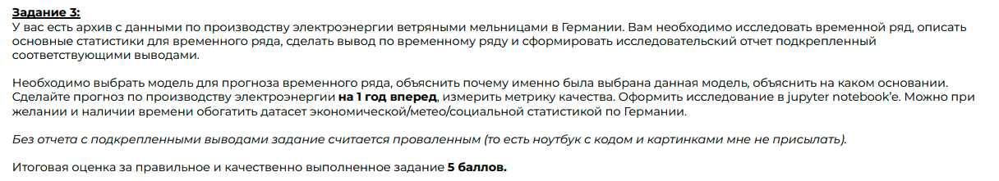

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
!pip install hvplot
import hvplot
sns.set()

import statsmodels.api as sm
import statsmodels.tsa.api as smt
from itertools import product
from tqdm import tqdm_notebook
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_pacf

from sklearn.pipeline import Pipeline
!pip install prophet
from prophet import Prophet
from sklearn.linear_model import Lasso,LinearRegression,Ridge,ElasticNet
import lightgbm as lgb
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,StandardScaler,RobustScaler,MinMaxScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV , StratifiedKFold
from sklearn.metrics import explained_variance_score,r2_score,mean_squared_error,mean_absolute_error

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install watermark --quiet
%load_ext watermark
%watermark -a 'Anrei Sech' -v -p torch

Author: Anrei Sech

Python implementation: CPython
Python version       : 3.7.15
IPython version      : 7.9.0

torch: 1.12.1+cu113



# Производство электроэнергии ветряными мельницами в Германии

## Импорт данных и предварительная обработка

In [3]:
from google.colab import drive
drive.mount('/drive/')

Drive already mounted at /drive/; to attempt to forcibly remount, call drive.mount("/drive/", force_remount=True).


Прочитаем файл с данными. В одно из колонок ('dt') содержатся данные о дате и времени. Преобразуем сразу эту колонку в формат datetime

In [4]:
df = pd.read_csv("/drive/My Drive/Time Series/data/data.csv", parse_dates=['dt'])

In [5]:
df.head()

,dt,MW
0,2011-01-01 00:00:00,3416.0
1,2011-01-01 00:15:00,4755.0
2,2011-01-01 00:30:00,4939.0
3,2011-01-01 00:45:00,4939.0
4,2011-01-01 01:00:00,4998.0


In [6]:
df.dtypes

dt    datetime64[ns]
MW           float64
dtype: object

У нас имеются исторические данные об уровне производства электроэнергии ветряными мельницами в Германии (в МВт) за период:

In [7]:
df['dt'].min().date(), df['dt'].max().date()

(datetime.date(2011, 1, 1), datetime.date(2021, 12, 30))

т.е. c 2011 по 2021 годы (за 10 лет) с измерением каждые 15 минут

In [8]:
df.describe()

,MW
count,385566.000000
mean,3183.560481
std,3045.941591
min,0.000000
25%,905.000000
50%,2164.000000
75%,4529.877500
max,16727.500000


Данные по производству электроэнергии при среднем значении в 3184 МВт (за период 15 мин.) колеблются в достаточно широких пределах

Пропущенные значение генерации энергии отсутствуют:

In [9]:
df['MW'].isnull().sum()

0

Сгруппируем данные по различным признакам и посмотрим в том числе, имеется ли выраженная сезонность

Производство электроэнергии как экономический показатель представляет собой поток, а не запас (т.е. вырабатывается/расходуется ЗА период, а не характеризуется значением на конкретный момент времени). К тому же электроэнергия являтется специфическим товаром, который не может накапливаться, его производство соответствует потреблению за аналогичный период. Поэтому при агрегации данных их следует суммировать.

In [10]:
df.resample('M', on='dt').sum()

,MW
dt,
2011-01-31,4753535.00
2011-02-28,4502270.00
2011-03-31,4948915.00
2011-04-30,4795377.00
2011-05-31,5590865.00
...,...
2021-08-31,11472360.83
2021-09-30,9261421.11
2021-10-31,13798147.07


Для большей наглядности визуализируем имеющиеся данные

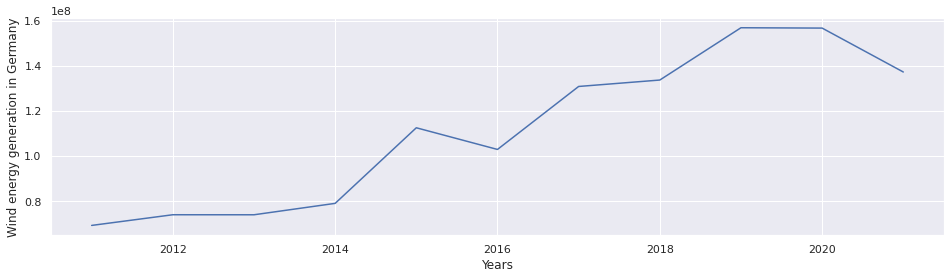

In [11]:
fig, axs = plt.subplots(figsize=(16, 4))
df.groupby(df["dt"].dt.year)["MW"].sum().plot(
    rot=0, ax=axs)
plt.xlabel("Years");
plt.ylabel("Wind energy generation in Germany")
plt.show();

В долгосрочной перспективе при анализе ежегодных данных прослеживается положительный тренд

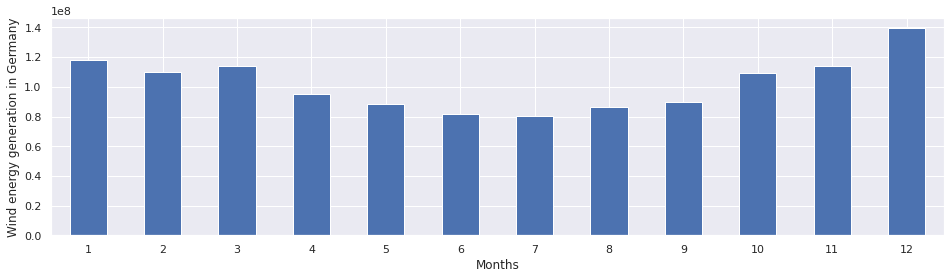

In [12]:
fig, axs = plt.subplots(figsize=(16, 4))
df.groupby(df["dt"].dt.month)["MW"].sum().plot(
    kind='bar', rot=0, ax=axs)
plt.xlabel("Months");
plt.ylabel("Wind energy generation in Germany")
plt.show();

В данных прослеживается достаточно заметная изменчивость (сезонность) в течении года. Эти изменения могут быть обусловленым различными факторами, такими как погодная (верняная) обстановка в регионе выработки энергии, уровнем производства и потребления электроэнергии за счет других альтернативных источников и т.д. Потребление электроэнергии увеличивается в зимний период видимо в том числе потому, что электроэнергия также используется для обогрева помещений

Помимо нее, что данные также подвержены и сезонности в течение дня, недели и месяца. Более которая изменцивость в большей степени обусловлена режимом светового дня, активностью потребителей электроэнергии

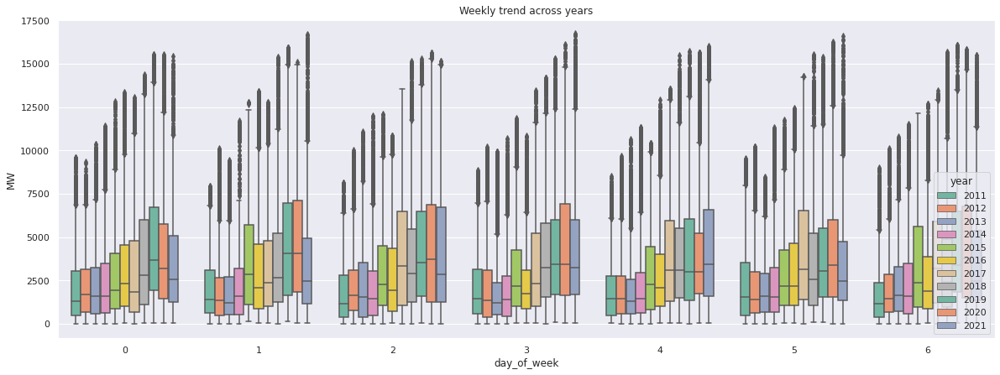

In [13]:
df['day_of_week'] = df["dt"].dt.day_of_week
df['year'] = df["dt"].dt.year
fig, axs = plt.subplots(1,1,figsize=(20, 7))
sns.boxplot(data=df, x='day_of_week', y='MW', hue='year', palette='Set2', ax=axs)
plt.title("Weekly trend across years")
plt.show();

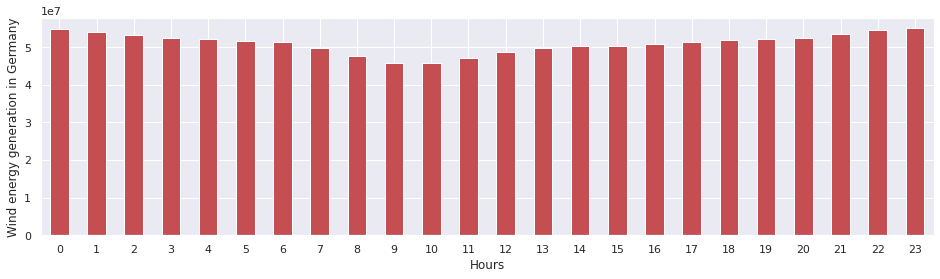

In [14]:
fig, axs = plt.subplots(figsize=(16, 4))
df.groupby(df["dt"].dt.hour)["MW"].sum().plot(
    kind='bar', rot=0, ax=axs, color='r')
plt.xlabel("Hours");
plt.ylabel("Wind energy generation in Germany")
plt.show();

В светлое время суток производство электроэнергии несколько ниже

In [15]:
seasons = ['Winter','Winter','Spring','Spring','Spring','Summer','Summer','Summer','Autumn','Autumn','Autumn','Winter']
season_num = [4,4,1,1,1,2,2,2,3,3,3,4]
month_to_season_num = dict(zip(range(1,13), season_num))

In [16]:
def return_date_features(df, datetime_col):
    df['date_hour'] = df[datetime_col].dt.floor('H')
    df['date'] = df[datetime_col].dt.floor('D')
    df['hour_of_day'] = df[datetime_col].dt.hour
    df['day_of_week'] = df[datetime_col].dt.dayofweek
    df['month_of_year'] = df[datetime_col].dt.month
    df['day_of_year'] = df[datetime_col].dt.dayofyear
    df['week_of_year'] = df[datetime_col].dt.isocalendar().week
    df['year'] = df[datetime_col].dt.year
    
    df['season'] = df[datetime_col].dt.month.map(month_to_season_num)
    
    return df

In [17]:
ts = return_date_features(df, 'dt')
ts.head()

,dt,MW,day_of_week,year,date_hour,date,hour_of_day,month_of_year,day_of_year,week_of_year,season
0,2011-01-01 00:00:00,3416.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4
1,2011-01-01 00:15:00,4755.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4
2,2011-01-01 00:30:00,4939.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4
3,2011-01-01 00:45:00,4939.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4
4,2011-01-01 01:00:00,4998.0,5,2011,2011-01-01 01:00:00,2011-01-01,1,1,1,52,4


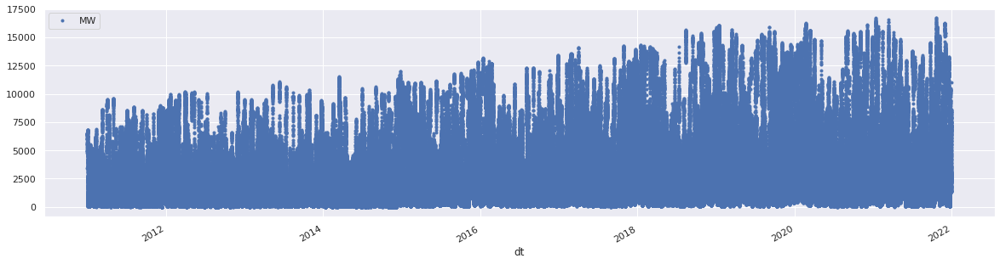

In [18]:
fig = ts.plot(x="dt", y="MW", style='.', figsize=(20,5))

Интервал данных временного ряда слишком частый. Преобразуем его в дневыне данные

In [19]:
wind_data_daily = ts.resample('D', on='date').sum()
wind_data_daily.head()

,MW,day_of_week,year,hour_of_day,month_of_year,day_of_year,week_of_year,season
date,,,,,,,,
2011-01-01,518229.0,480,193056,1104,96,96,4992,384
2011-01-02,83077.0,576,193056,1104,96,192,4992,384
2011-01-03,73095.0,0,193056,1104,96,288,96,384
2011-01-04,376606.0,96,193056,1104,96,384,96,384
2011-01-05,216599.0,192,193056,1104,96,480,96,384


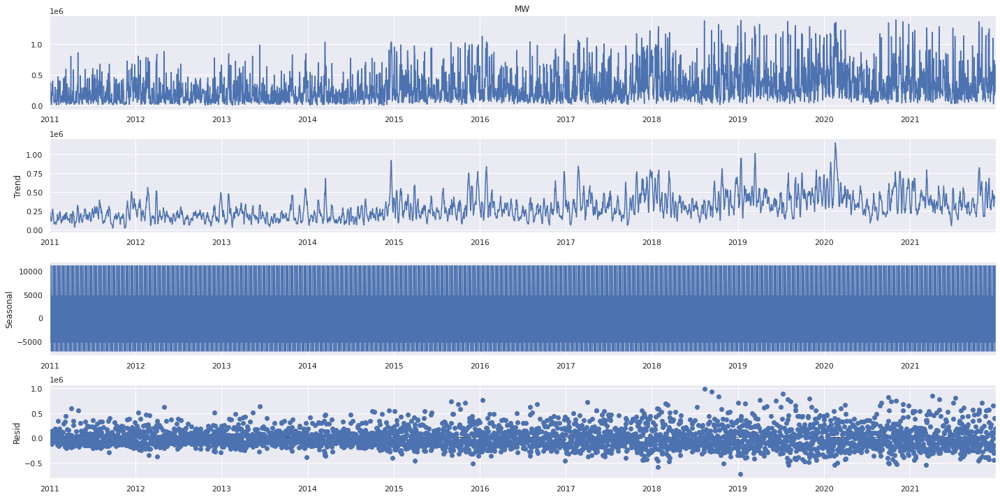

In [20]:
data_decomposed = seasonal_decompose(wind_data_daily['MW'], model='additive')
plt.rcParams['figure.figsize'] = [20, 10]
plot = data_decomposed.plot()

In [21]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test

        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, zero=False)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, zero=False)
        plt.tight_layout()

In [25]:
#tsplot(df['MW'], lags=20)

In [ ]:
# TODO
# пока вылетает с ошибкой
#p_value = sm.tsa.stattools.adfuller(df['MW'])[1]

Так как p-value (больше/меньше) 0.05, то ряд (нестационарный/стационарный)

Анализ выбросов

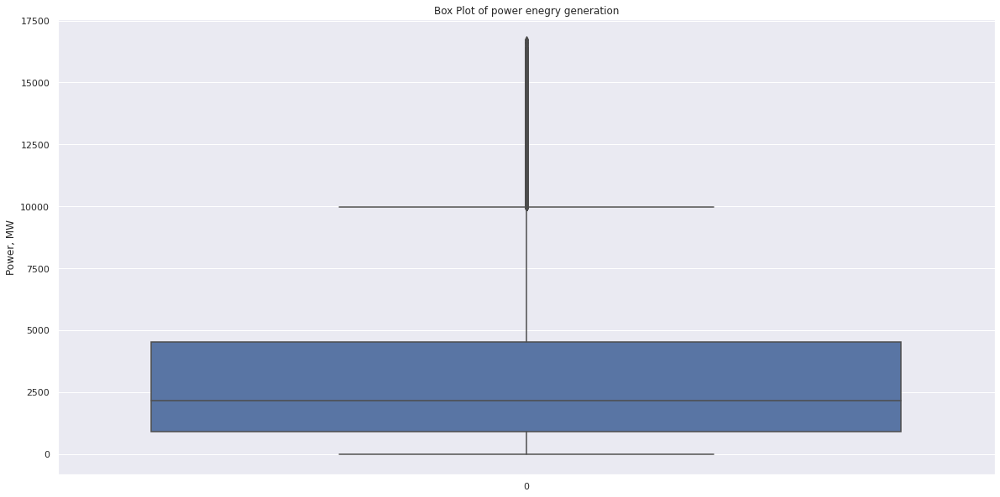

In [22]:
sns.boxplot(data=df['MW'])
plt.title('Box Plot of power enegry generation')
plt.ylabel('Power, MW')
plt.show()

Большая часть значнений находится внизу диапазона, так что максимальные пиковые значения явлются скорее аномальными (нетипичными)

### Feature Engineering

In [23]:
data = ts.copy()

Добавим некоторые дополнительные временные признаки, которые теоретически могут оказаться полезными

In [24]:
data['month_name'] = data['dt'].dt.month
data['is_night'] = (data['dt'].dt.hour>17).astype(int)
data['is_dawn'] = ((data['dt'].dt.hour<=6) &  (data['dt'].dt.hour>=0) ).astype(int)
data['is_morning'] = ((data['dt'].dt.hour>6) &  (data['dt'].dt.hour<=12) ).astype(int)
data['is_afternoon'] = ((data['dt'].dt.hour>12) &  (data['dt'].dt.hour<=16) ).astype(int)
data.head()

,dt,MW,day_of_week,year,date_hour,date,hour_of_day,month_of_year,day_of_year,week_of_year,season,month_name,is_night,is_dawn,is_morning,is_afternoon
0,2011-01-01 00:00:00,3416.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4,1,0,1,0,0
1,2011-01-01 00:15:00,4755.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4,1,0,1,0,0
2,2011-01-01 00:30:00,4939.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4,1,0,1,0,0
3,2011-01-01 00:45:00,4939.0,5,2011,2011-01-01 00:00:00,2011-01-01,0,1,1,52,4,1,0,1,0,0
4,2011-01-01 01:00:00,4998.0,5,2011,2011-01-01 01:00:00,2011-01-01,1,1,1,52,4,1,0,1,0,0


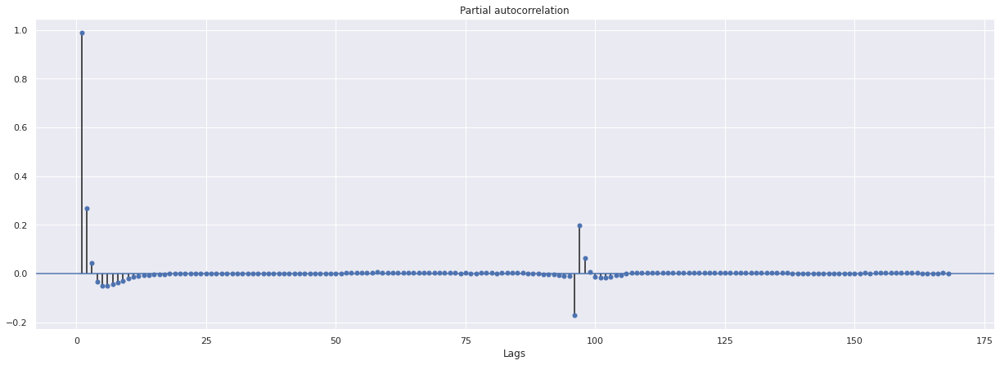

In [25]:
dataframe = data.set_index('dt')
plt.rc("figure", figsize=(21, 7))
plot_pacf(dataframe['MW'], lags=24*7, zero=False)
plt.xlabel('Lags')
plt.title('Partial autocorrelation')
plt.show();

In [26]:
for x in [1,12,24,48,72]:
    data[f'lagged_power_{x}'] = data['MW'].shift(x).bfill()

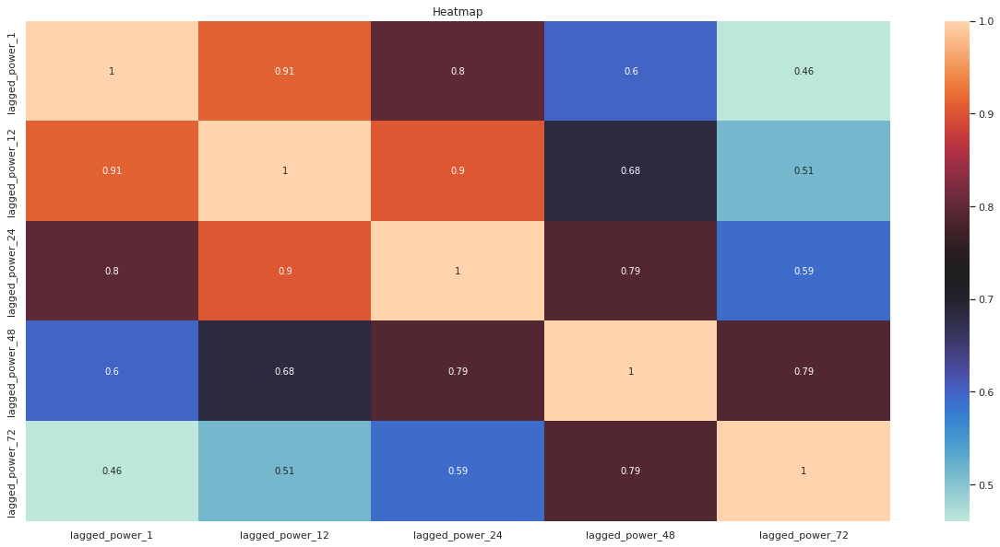

In [27]:
cor = data.filter(regex='power').corr()
fig,axes = plt.subplots(1,1,figsize=(21,10))
sns.heatmap(cor,annot=True, cmap ='icefire')
plt.title('Heatmap')
plt.show()

Формируем dataset для прогнозирования

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 385566 entries, 0 to 385565
Data columns (total 21 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   dt               385566 non-null  datetime64[ns]
 1   MW               385566 non-null  float64       
 2   day_of_week      385566 non-null  int64         
 3   year             385566 non-null  int64         
 4   date_hour        385566 non-null  datetime64[ns]
 5   date             385566 non-null  datetime64[ns]
 6   hour_of_day      385566 non-null  int64         
 7   month_of_year    385566 non-null  int64         
 8   day_of_year      385566 non-null  int64         
 9   week_of_year     385566 non-null  UInt32        
 10  season           385566 non-null  int64         
 11  month_name       385566 non-null  int64         
 12  is_night         385566 non-null  int64         
 13  is_dawn          385566 non-null  int64         
 14  is_morning       385

In [29]:
train_data = pd.DataFrame()
target = 4*24*365 # forecasting on 1 year ahead: 4*15min = 1 hour * 24 hours * 365 days
data['ramp'] = data['MW'] - data['MW'].shift(target)
features = ['dt', 'MW', 'season', 'month_name', 'is_night', 'is_dawn', 'is_morning', 'is_afternoon', 'lagged_power_1', 'lagged_power_12', \
            'lagged_power_24', 'lagged_power_48', 'lagged_power_72']
train_data = data[features].copy()
for feature in train_data.columns:
    train_data[feature] = train_data[feature].shift(-target )
print(train_data.shape)
train_data.head()

(385566, 13)


,dt,MW,season,month_name,is_night,is_dawn,is_morning,is_afternoon,lagged_power_1,lagged_power_12,lagged_power_24,lagged_power_48,lagged_power_72
0,2012-01-01 00:00:00,6092.0,4.0,1.0,0.0,1.0,0.0,0.0,1092.0,1073.0,884.0,512.0,1504.0
1,2012-01-01 00:15:00,1211.0,4.0,1.0,0.0,1.0,0.0,0.0,6092.0,1096.0,931.0,475.0,1410.0
2,2012-01-01 00:30:00,1244.0,4.0,1.0,0.0,1.0,0.0,0.0,1211.0,1137.0,1019.0,423.0,1273.0
3,2012-01-01 00:45:00,1280.0,4.0,1.0,0.0,1.0,0.0,0.0,1244.0,1211.0,1040.0,401.0,1215.0
4,2012-01-01 01:00:00,1352.0,4.0,1.0,0.0,1.0,0.0,0.0,1280.0,1252.0,1035.0,355.0,1109.0


In [30]:
split_date = '2018-01-01'
data['type'] = 'train'
data.loc[data['dt']>= split_date, 'type'] = 'test'
train = data.loc[data['type'] == 'train'].reset_index(drop=True)
test = data.loc[data['type'] == 'test'].reset_index(drop=True)

In [31]:
train.shape, test.shape

((245472, 23), (140094, 23))

In [32]:
import plotly.express as px
fig = px.scatter(data, x="date", y="MW", hover_data=['day_of_week'], color='type')
fig.update_traces(mode='markers+lines', marker_size=3)
fig.show();

In [33]:
def eval_accuracy(y_true, y_pred):
    # mean absolute error (MAE)
    mae = mean_absolute_error(y_true, y_pred)
    
    # root mean squared error (RMSE)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    
    # mean absolute percentage error (MAPE)
    mape = np.mean(np.abs((y_true-y_pred) / y_true)) * 100
    
    return {'MAE': round(mae, 3),
           'RMSE': round(rmse, 3),
           'MAPE': round(mape, 3)}

Forecasting with FB (Meta) Prophet

In [34]:
model_prophet = Prophet(changepoint_prior_scale=0.5,seasonality_prior_scale=0.01)
model_prophet.fit(train.rename(columns={'dt':'ds', 'MW':'y'}))

DEBUG:cmdstanpy:input tempfile: /tmp/tmp075u36jn/9njes0dt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp075u36jn/ut5rz87m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22143', 'data', 'file=/tmp/tmp075u36jn/9njes0dt.json', 'init=/tmp/tmp075u36jn/ut5rz87m.json', 'output', 'file=/tmp/tmp075u36jn/prophet_modeloe0_hzyn/prophet_model-20221025204841.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:48:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:53:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [35]:
test_prophet = model_prophet.predict(df = test.rename(columns={'dt':'ds', 'MW':'y'}))

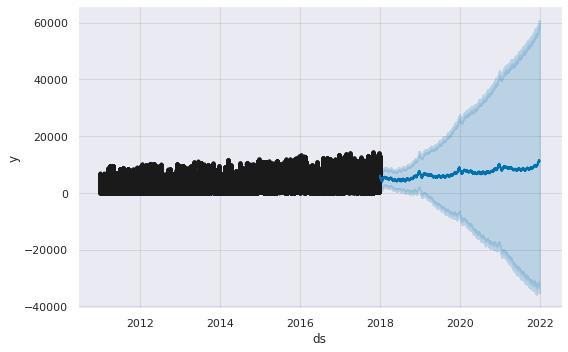

In [36]:
fig = model_prophet.plot(test_prophet, figsize=(8,5))

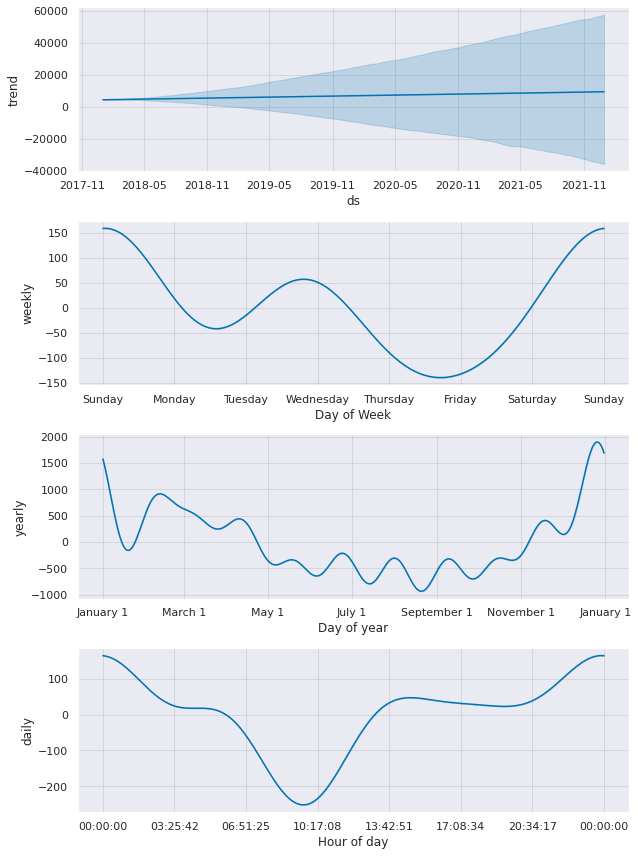

In [37]:
fig = model_prophet.plot_components(test_prophet)

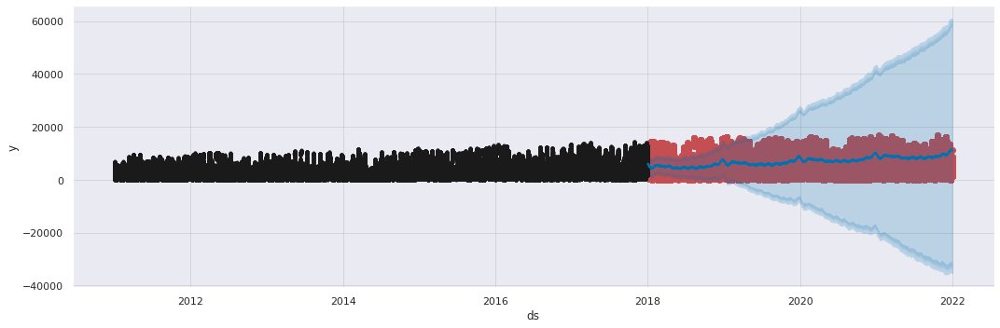

In [38]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(test['dt'], test["MW"], color='r')
fig = model_prophet.plot(test_prophet, ax=ax)

In [39]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def eval_accuracy(y_true, y_pred):
    """
    y_true - actual values as pandas series
    y_pred - predicted values as pandas series
    return: dictionary with MAE, RMSE and MAPE metrics
    """
    #mean absolute error (MAE)
    mae = mean_absolute_error(y_true, y_pred)
    
    #root mean squared error (RMSE)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    
    #mean absolute percentage error (MAPE)
    mape = np.mean(np.abs((y_true-y_pred) / y_true)) * 100
    
    return {'MAE': round(mae, 3),
           'RMSE': round(rmse, 3),
           'MAPE': round(mape, 3)}

In [41]:
eval_accuracy(test["MW"], test_prophet['yhat'])

{'MAE': 4043.532, 'RMSE': 4642.469, 'MAPE': 445.707}

Качество модели оставляет желать лучше. Прогноз ошибается в 4.5 раза. Для составления долгосрочных прогнозов (год или более) необходимо добавлять дополнительные эндогенные признаки